In [1]:
#Import dependencies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#Setting graph visual preferences
from matplotlib import rcParams
rcParams['figure.figsize'] = 18, 8
sns.set_style('darkgrid')

In [3]:
#Load in breast cancer data set
cancer_df = pd.read_csv('data.csv')
cancer_df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
########################################## DATA EXPLORATION ###################################################################

In [5]:
#Since there is an extra column with all null value, we will drop it.
# We will also drop id since it is not neccsary for our data analysis and model.
cancer_df.drop(labels=['Unnamed: 32', 'id'], axis=1, inplace=True)
cancer_df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [6]:
#Gather general information about the data set
cancer_df.info()

#From the info tab, the df has a total of 569 rows with 31 columns.
# There are no null value, most coulumns are numerical value. The only exception is the diagnosis column which is the string target

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [7]:
#Gather statiscal describtion about the data set
cancer_df.describe()

#Overall the values of all the numerical columns are not out of the ordinary.
# There are some columns that have a minimum value of 0, which can be missing values or the values are acutally 0

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [8]:
for column in cancer_df:
    if min(cancer_df[column]) == 0:
        print(column)
        
#Below are the columns that have a minimum values of 0 in the data set. Based on researching online, it seems that all these
# values can be = 0. Thus, there is not enough information to conclude that the 0 in these column are missing data.

concavity_mean
concave points_mean
concavity_se
concave points_se
concavity_worst
concave points_worst


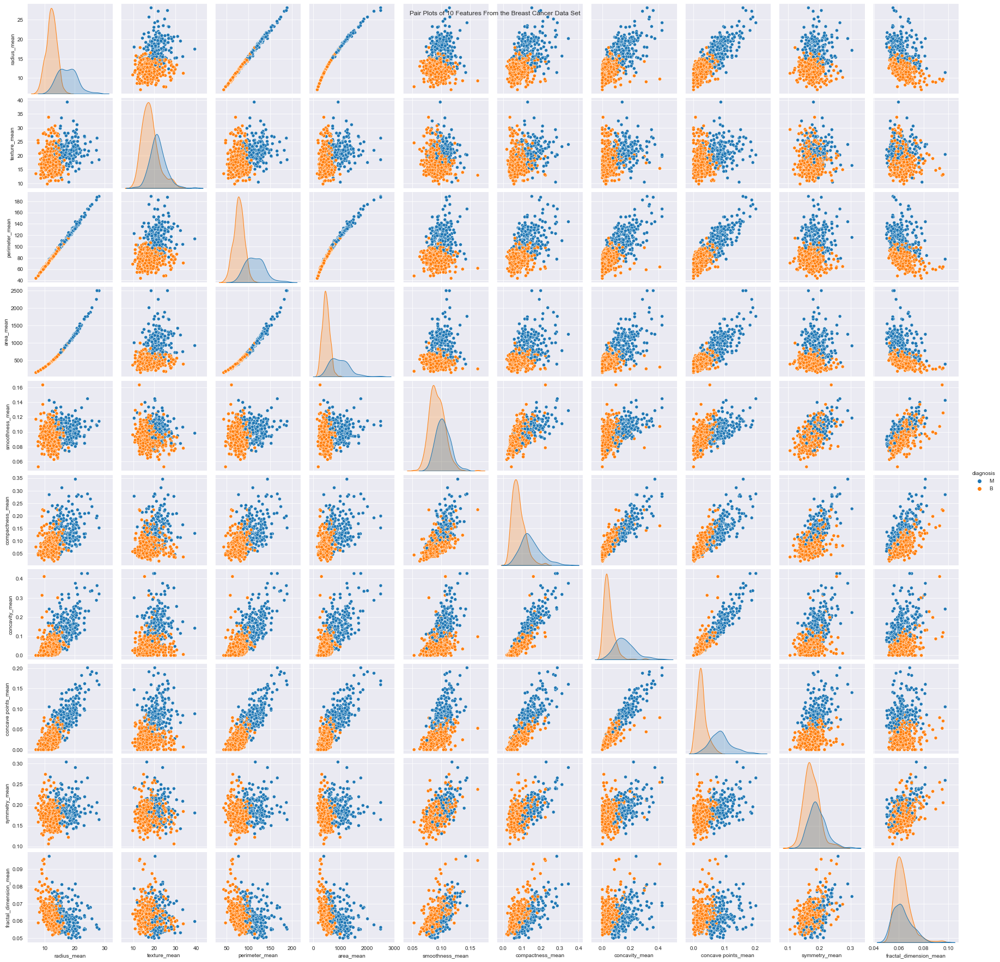

In [9]:
#Pair plot of 10 features in the data set based on diagonisis hue value
sns.pairplot(cancer_df, hue='diagnosis', vars=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean','concave points_mean', 'symmetry_mean', 'fractal_dimension_mean'])
plt.suptitle('Pair Plots of 10 Features From the Breast Cancer Data Set')
plt.show()

#For a lot of features, there is quite a clear distinction between B and M diagonisis. This is promising for a good model.

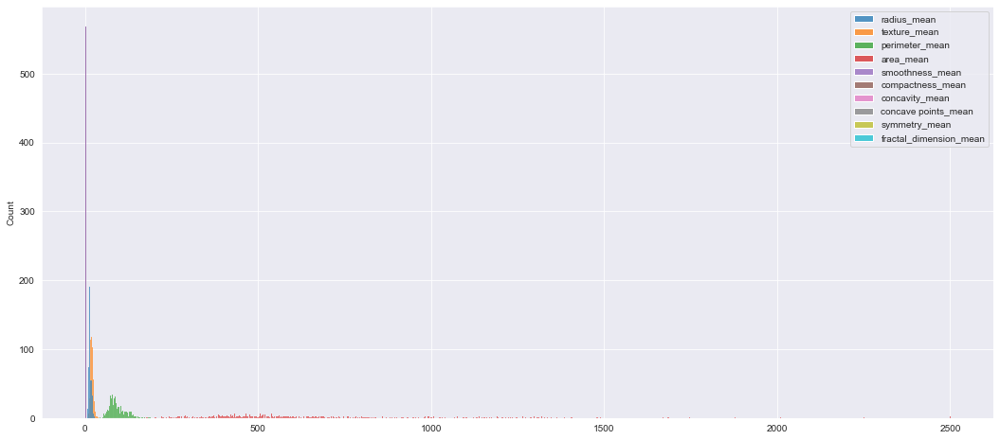

In [10]:
#Histogram plot of 10 features in the data set
sns.histplot(cancer_df[['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean','concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']])
plt.show()

#Too far away to tell any useful information

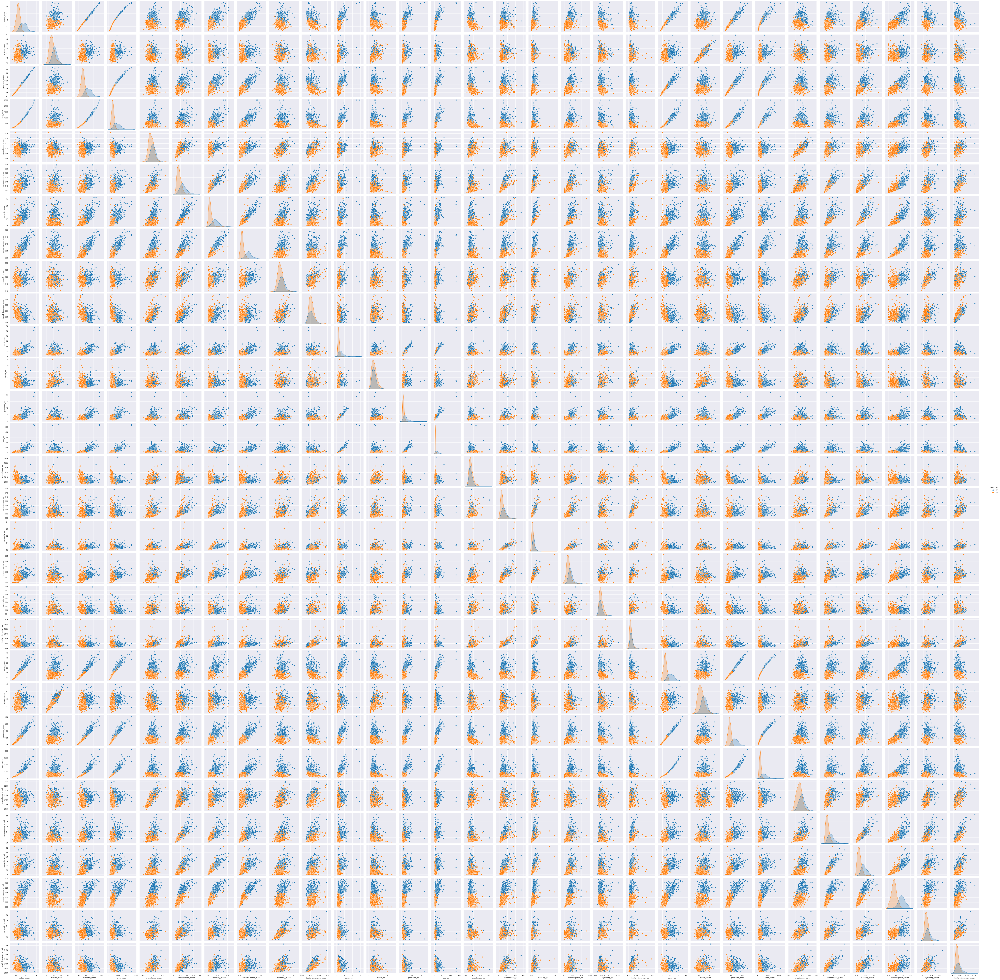

In [11]:
#Overall pair plots of all attributes
sns.pairplot(cancer_df, hue = 'diagnosis', vars = (cancer_df.drop(labels = ['diagnosis'], axis = 1).columns))
plt.show()

#Too much information

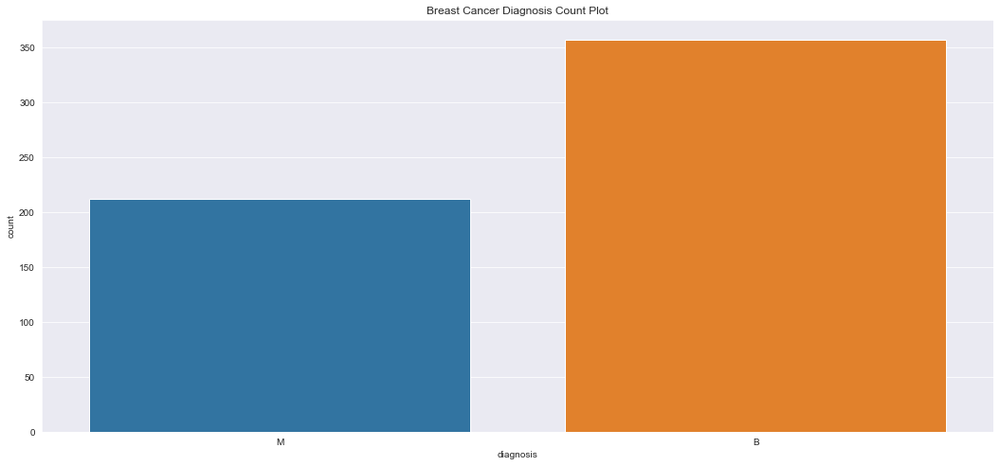

In [12]:
sns.countplot(x = cancer_df['diagnosis'])
plt.title('Breast Cancer Diagnosis Count Plot')
plt.show()

#Based on the graph, the amount of people being diagnosed with type B is close to double the amount of people diagnosed with type A

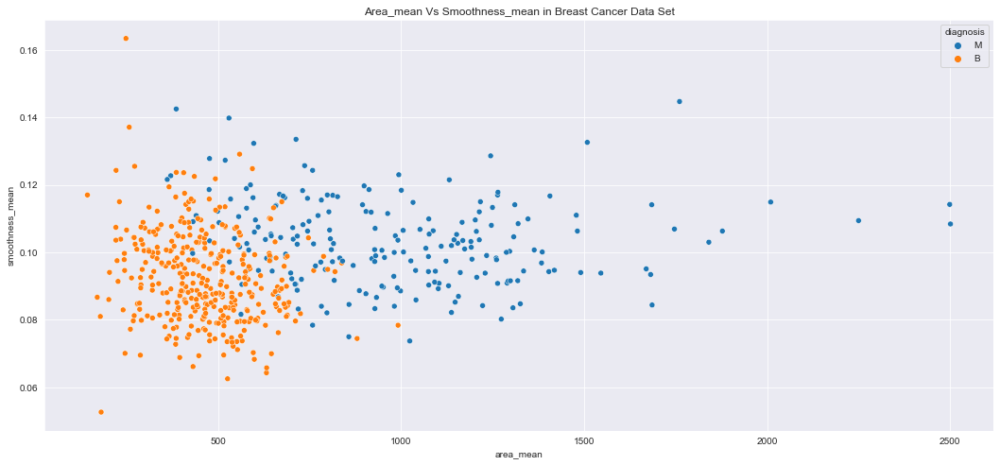

In [13]:
#Area mean is one of the good predictor based on the good speration between the two type of cancer
sns.scatterplot(x = 'area_mean', y = 'smoothness_mean', hue = 'diagnosis', data = cancer_df)
plt.title('Area_mean Vs Smoothness_mean in Breast Cancer Data Set')
plt.show()

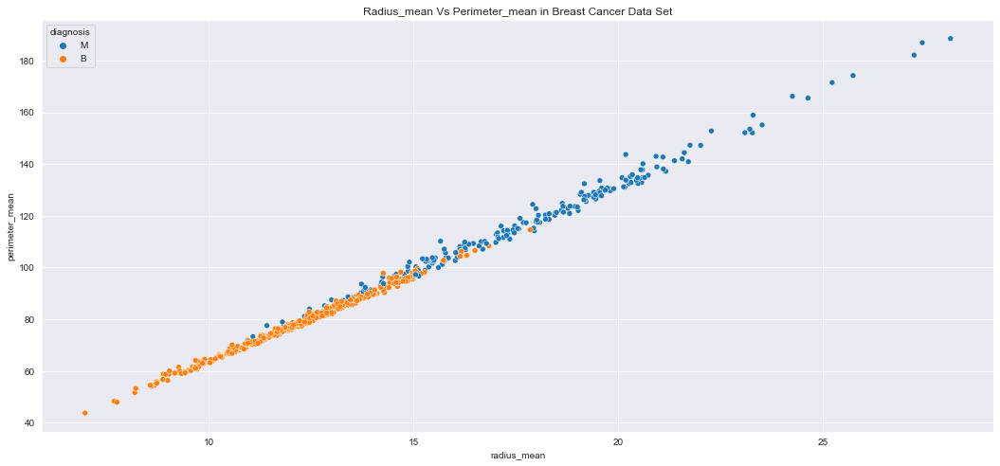

In [14]:
#Another good indicator is
sns.scatterplot(x = 'radius_mean', y = 'perimeter_mean', hue = 'diagnosis', data = cancer_df)
plt.title('Radius_mean Vs Perimeter_mean in Breast Cancer Data Set')
plt.show()
#We also see a big speration here with B type focused <= 15 in radius mean and 100 <= perimeter mean. The rest are of type M.

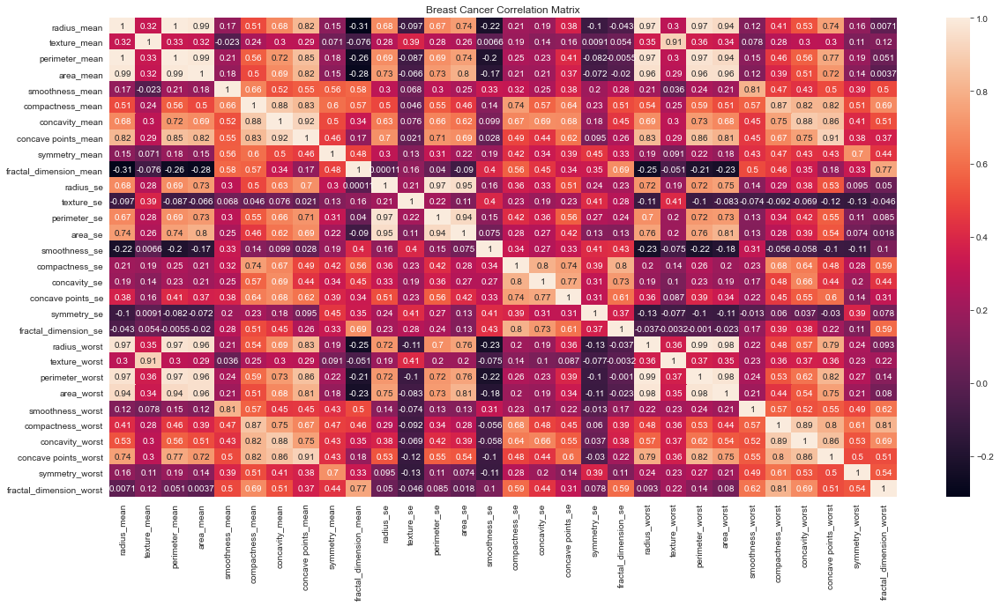

In [15]:
#Check data correlation between data with the correlation matrix
plt.figure(figsize = (20, 10))
sns.heatmap(cancer_df.corr(), annot = True)
plt.title('Breast Cancer Correlation Matrix')
plt.show()

#From the correlation matrix, there are multiple features that are highly related to each other. Some of which are radius_mean
# and are_mean at 0.99, area_mean and perimeter_mean at 0.99, etc. 

In [16]:
################################################# PRE-PROCESSING DATA #########################################################

In [17]:
#Now we will scale the data using Standard Scaler.
# We are also going to add in Zscaler to see the performance difference between standard scaler and minMaxScaler
from sklearn.preprocessing import StandardScaler

X = cancer_df.drop('diagnosis', axis = 1)
y = cancer_df['diagnosis']

standard_scaler = StandardScaler()
X_standard_scaled = standard_scaler.fit_transform(X)
X_standard = pd.DataFrame(data = X_standard_scaled, columns = X.columns)

In [18]:
from sklearn.preprocessing import MinMaxScaler

minMax_scaler = MinMaxScaler()
X_minMax_scaled = minMax_scaler.fit_transform(X)
X_minMax = pd.DataFrame(data = X_minMax_scaled, columns = X.columns)

In [19]:
############################################# CREATING THE MODELS ############################################################

In [20]:
#Spliting the data set with a ratio of 70/30 train/test for both data scaled using standard scaler and data scaled using minMax
from sklearn.model_selection import train_test_split

X_standard_train, X_standard_test, y_standard_train, y_standard_test = train_test_split(X_standard, y, test_size = 0.3, random_state = 129)
X_minMax_train, X_minMax_test, y_minMax_train, y_minMax_test = train_test_split(X_minMax, y, test_size = 0.3, random_state = 129)

In [21]:
#We are going to create two SVC models for standard scaling and minMax scaling
from sklearn.svm import SVC
model_standard = SVC()
model_minMax = SVC()

model_standard.fit(X_standard_train, y_standard_train)
model_minMax.fit(X_minMax_train, y_minMax_train)

SVC()

In [22]:
################################################### MODEL EVALUATION #########################################################

In [23]:
#Predictions for two models
standard_predictions = model_standard.predict(X_standard_test)
minMax_predictions = model_minMax.predict(X_minMax_test)

In [24]:
#Model performance
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

standard_cm = confusion_matrix(y_standard_test, standard_predictions)
minMax_cm = confusion_matrix(y_minMax_test, minMax_predictions)

#of standard scaling
print('Confusion matrix\n\n', standard_cm)
print('\nTrue Positives(TP) = ', standard_cm[0,0])
print('\nTrue Negatives(TN) = ', standard_cm[1,1])
print('\nFalse Positives(FP) = ', standard_cm[0,1])
print('\nFalse Negatives(FN) = ', standard_cm[1,0])

print(classification_report(y_standard_test,standard_predictions))

Confusion matrix

 [[100   1]
 [  5  65]]

True Positives(TP) =  100

True Negatives(TN) =  65

False Positives(FP) =  1

False Negatives(FN) =  5
              precision    recall  f1-score   support

           B       0.95      0.99      0.97       101
           M       0.98      0.93      0.96        70

    accuracy                           0.96       171
   macro avg       0.97      0.96      0.96       171
weighted avg       0.97      0.96      0.96       171



In [25]:
#of minMax scaling
print('Confusion matrix\n\n', minMax_cm)
print('\nTrue Positives(TP) = ', minMax_cm[0,0])
print('\nTrue Negatives(TN) = ', minMax_cm[1,1])
print('\nFalse Positives(FP) = ', minMax_cm[0,1])
print('\nFalse Negatives(FN) = ', minMax_cm[1,0])

print(classification_report(y_minMax_test,minMax_predictions))

#The performance of standard scaling and minMax scaling is identical in this example with the same random_state = 129
# Overall the performance of the model is great with an overall accuracy of 0.97 or 97%.

#Since the performance of standard scaling and minMax scaling is identical, from now on we will only be using the standard scaled
# model.

Confusion matrix

 [[100   1]
 [  5  65]]

True Positives(TP) =  100

True Negatives(TN) =  65

False Positives(FP) =  1

False Negatives(FN) =  5
              precision    recall  f1-score   support

           B       0.95      0.99      0.97       101
           M       0.98      0.93      0.96        70

    accuracy                           0.96       171
   macro avg       0.97      0.96      0.96       171
weighted avg       0.97      0.96      0.96       171



In [26]:
#Hyperparameter Tuning
# In many model, finding the right parameters is tricky. Fortunately, we can utilize some tools to try a bunch of combination
# and see what gives the best result. This idea of creating a 'grid' of parameters and just trying all the possible combinations
# is called a Gridsearch. Sklearn has an implementation of this method called GridSearchCV (CV for cross-validation)

#GridSearchCV takes a dictionary that describes the parameters that should be tried and a model to train. The grid of parameters
# is defined as a dictionary, where the keys are the parameters and the values are the settings to be tested. 
param_grid = {'C' : [0.1, 1, 10, 100, 1000], 'gamma' : [1, 0.1, 0.01, 0.001, 0.0001], 'kernel' : ['rbf']}

In [27]:
from sklearn.model_selection import GridSearchCV

grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3) #verbose just means how much text we want to output describing
                                                                    # the process

In [28]:
#The fit here is more involved than usual. First, it runs the same loop with cross-validation to find the best parameter 
# combination. Once it has the best combination, it runs fit again on all data passed to fit (without cross-validation), to 
# build a single new model using the best paramters.
grid.fit(X_standard_train, y_standard_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 2/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 4/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 1/5] END ..................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=0.1, gamma=0.0

[CV 1/5] END ....................C=1000, gamma=1, kernel=rbf; total time=   0.0s
[CV 2/5] END ....................C=1000, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END ....................C=1000, gamma=1, kernel=rbf; total time=   0.0s
[CV 4/5] END ....................C=1000, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END ....................C=1000, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 1/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 3/5] END ...............

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [29]:
#We can retrieve the best params using 
grid.best_params_

{'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}

In [30]:
#Now we reeavluate the model to see if the performance has increased
grid_predictions = grid.predict(X_standard_test)

In [31]:
#Grid model performance
print(confusion_matrix(y_standard_test,grid_predictions))
print(classification_report(y_standard_test,grid_predictions))

#Unfortunately, with this particular set of train_test_split and parameters, the model didn't improve in performance. However,
# the original performance is already great, so there is little room for improvement.

[[100   1]
 [  5  65]]
              precision    recall  f1-score   support

           B       0.95      0.99      0.97       101
           M       0.98      0.93      0.96        70

    accuracy                           0.96       171
   macro avg       0.97      0.96      0.96       171
weighted avg       0.97      0.96      0.96       171



In [32]:
#Increase params
param_grid = {'C' : [i for i in range(1, 50)], 'gamma' : [1, 0.1, 0.03, 0.02, 0.01, 0.005, 0.0001], 'kernel' : ['rbf', 'linear', 'sigmoid']}
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)
grid.fit(X_standard_train, y_standard_train)

Fitting 5 folds for each of 1029 candidates, totalling 5145 fits
[CV 1/5] END .......................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV 2/5] END .......................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END .......................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV 4/5] END .......................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END .......................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ....................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV 2/5] END ....................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV 3/5] END ....................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV 4/5] END ....................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV 5/5] END ....................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV 1/5] END ...................C=1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...................C=1, gamma=1

[CV 2/5] END ..................C=2, gamma=0.1, kernel=linear; total time=   0.0s
[CV 3/5] END ..................C=2, gamma=0.1, kernel=linear; total time=   0.0s
[CV 4/5] END ..................C=2, gamma=0.1, kernel=linear; total time=   0.0s
[CV 5/5] END ..................C=2, gamma=0.1, kernel=linear; total time=   0.0s
[CV 1/5] END .................C=2, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END .................C=2, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END .................C=2, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END .................C=2, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END .................C=2, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ....................C=2, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 2/5] END ....................C=2, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 3/5] END ....................C=2, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 4/5] END ...............

[CV 3/5] END ................C=3, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ................C=3, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ................C=3, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ....................C=3, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END ....................C=3, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 3/5] END ....................C=3, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 4/5] END ....................C=3, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 5/5] END ....................C=3, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 1/5] END .................C=3, gamma=0.01, kernel=linear; total time=   0.0s
[CV 2/5] END .................C=3, gamma=0.01, kernel=linear; total time=   0.0s
[CV 3/5] END .................C=3, gamma=0.01, kernel=linear; total time=   0.0s
[CV 4/5] END .................C=3, gamma=0.01, kernel=linear; total time=   0.0s
[CV 5/5] END ...............

[CV 3/5] END ..................C=4, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 4/5] END ..................C=4, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 5/5] END ..................C=4, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............C=4, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 2/5] END ...............C=4, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 3/5] END ...............C=4, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 4/5] END ...............C=4, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 5/5] END ...............C=4, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 1/5] END ..............C=4, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ..............C=4, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..............C=4, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ..............C=4, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ..............C

[CV 4/5] END ...................C=6, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...................C=6, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END .....................C=6, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END .....................C=6, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END .....................C=6, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END .....................C=6, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END .....................C=6, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 1/5] END ..................C=6, gamma=0.1, kernel=linear; total time=   0.0s
[CV 2/5] END ..................C=6, gamma=0.1, kernel=linear; total time=   0.0s
[CV 3/5] END ..................C=6, gamma=0.1, kernel=linear; total time=   0.0s
[CV 4/5] END ..................C=6, gamma=0.1, kernel=linear; total time=   0.0s
[CV 5/5] END ..................C=6, gamma=0.1, kernel=linear; total time=   0.0s
[CV 1/5] END ...............

[CV 5/5] END ....................C=7, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 1/5] END .................C=7, gamma=0.02, kernel=linear; total time=   0.0s
[CV 2/5] END .................C=7, gamma=0.02, kernel=linear; total time=   0.0s
[CV 3/5] END .................C=7, gamma=0.02, kernel=linear; total time=   0.0s
[CV 4/5] END .................C=7, gamma=0.02, kernel=linear; total time=   0.0s
[CV 5/5] END .................C=7, gamma=0.02, kernel=linear; total time=   0.0s
[CV 1/5] END ................C=7, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ................C=7, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ................C=7, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ................C=7, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ................C=7, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ....................C=7, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END ...............

[CV 4/5] END ...............C=8, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=8, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ..................C=8, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=8, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 3/5] END ..................C=8, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 4/5] END ..................C=8, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 5/5] END ..................C=8, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............C=8, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 2/5] END ...............C=8, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 3/5] END ...............C=8, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 4/5] END ...............C=8, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 5/5] END ...............C=8, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 1/5] END ..............C

[CV 5/5] END ......................C=10, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ...................C=10, gamma=1, kernel=linear; total time=   0.0s
[CV 2/5] END ...................C=10, gamma=1, kernel=linear; total time=   0.0s
[CV 3/5] END ...................C=10, gamma=1, kernel=linear; total time=   0.0s
[CV 4/5] END ...................C=10, gamma=1, kernel=linear; total time=   0.0s
[CV 5/5] END ...................C=10, gamma=1, kernel=linear; total time=   0.0s
[CV 1/5] END ..................C=10, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ..................C=10, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..................C=10, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ..................C=10, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ..................C=10, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ....................C=10, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ...............

[CV 2/5] END ......................C=11, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END ......................C=11, gamma=1, kernel=rbf; total time=   0.0s
[CV 4/5] END ......................C=11, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END ......................C=11, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ...................C=11, gamma=1, kernel=linear; total time=   0.0s
[CV 2/5] END ...................C=11, gamma=1, kernel=linear; total time=   0.0s
[CV 3/5] END ...................C=11, gamma=1, kernel=linear; total time=   0.0s
[CV 4/5] END ...................C=11, gamma=1, kernel=linear; total time=   0.0s
[CV 5/5] END ...................C=11, gamma=1, kernel=linear; total time=   0.0s
[CV 1/5] END ..................C=11, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ..................C=11, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..................C=11, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............

[CV 1/5] END .................C=12, gamma=0.1, kernel=linear; total time=   0.0s
[CV 2/5] END .................C=12, gamma=0.1, kernel=linear; total time=   0.0s
[CV 3/5] END .................C=12, gamma=0.1, kernel=linear; total time=   0.0s
[CV 4/5] END .................C=12, gamma=0.1, kernel=linear; total time=   0.0s
[CV 5/5] END .................C=12, gamma=0.1, kernel=linear; total time=   0.0s
[CV 1/5] END ................C=12, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ................C=12, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ................C=12, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ................C=12, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ................C=12, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...................C=12, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=12, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 3/5] END ...............

[CV 3/5] END ................C=13, gamma=0.02, kernel=linear; total time=   0.0s
[CV 4/5] END ................C=13, gamma=0.02, kernel=linear; total time=   0.0s
[CV 5/5] END ................C=13, gamma=0.02, kernel=linear; total time=   0.0s
[CV 1/5] END ...............C=13, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=13, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=13, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=13, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=13, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...................C=13, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=13, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=13, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=13, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 5/5] END ...............

[CV 2/5] END ..............C=14, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..............C=14, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ..............C=14, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ..............C=14, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 1/5] END .................C=14, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 2/5] END .................C=14, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 3/5] END .................C=14, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 4/5] END .................C=14, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 5/5] END .................C=14, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 1/5] END ..............C=14, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 2/5] END ..............C=14, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 3/5] END ..............C=14, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 4/5] END ..............C

[CV 3/5] END ...................C=16, gamma=1, kernel=linear; total time=   0.0s
[CV 4/5] END ...................C=16, gamma=1, kernel=linear; total time=   0.0s
[CV 5/5] END ...................C=16, gamma=1, kernel=linear; total time=   0.0s
[CV 1/5] END ..................C=16, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ..................C=16, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..................C=16, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ..................C=16, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ..................C=16, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ....................C=16, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ....................C=16, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ....................C=16, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ....................C=16, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ...............

[CV 4/5] END ................C=17, gamma=0.03, kernel=linear; total time=   0.0s
[CV 5/5] END ................C=17, gamma=0.03, kernel=linear; total time=   0.0s
[CV 1/5] END ...............C=17, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=17, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=17, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=17, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=17, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...................C=17, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=17, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=17, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=17, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=17, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............

[CV 1/5] END ...............C=18, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=18, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=18, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=18, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=18, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ..................C=18, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=18, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 3/5] END ..................C=18, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 4/5] END ..................C=18, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 5/5] END ..................C=18, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............C=18, gamma=0.005, kernel=linear; total time=   0.0s
[CV 2/5] END ...............C=18, gamma=0.005, kernel=linear; total time=   0.0s
[CV 3/5] END ...............

[CV 2/5] END .............C=19, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 3/5] END .............C=19, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 4/5] END .............C=19, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 5/5] END .............C=19, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ......................C=20, gamma=1, kernel=rbf; total time=   0.0s
[CV 2/5] END ......................C=20, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END ......................C=20, gamma=1, kernel=rbf; total time=   0.0s
[CV 4/5] END ......................C=20, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END ......................C=20, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ...................C=20, gamma=1, kernel=linear; total time=   0.0s
[CV 2/5] END ...................C=20, gamma=1, kernel=linear; total time=   0.0s
[CV 3/5] END ...................C=20, gamma=1, kernel=linear; total time=   0.0s
[CV 4/5] END ...............

[CV 2/5] END .................C=21, gamma=0.1, kernel=linear; total time=   0.0s
[CV 3/5] END .................C=21, gamma=0.1, kernel=linear; total time=   0.0s
[CV 4/5] END .................C=21, gamma=0.1, kernel=linear; total time=   0.0s
[CV 5/5] END .................C=21, gamma=0.1, kernel=linear; total time=   0.0s
[CV 1/5] END ................C=21, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ................C=21, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ................C=21, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ................C=21, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ................C=21, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...................C=21, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=21, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=21, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 4/5] END ...............

[CV 4/5] END ...................C=22, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=22, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 1/5] END ................C=22, gamma=0.02, kernel=linear; total time=   0.0s
[CV 2/5] END ................C=22, gamma=0.02, kernel=linear; total time=   0.0s
[CV 3/5] END ................C=22, gamma=0.02, kernel=linear; total time=   0.0s
[CV 4/5] END ................C=22, gamma=0.02, kernel=linear; total time=   0.0s
[CV 5/5] END ................C=22, gamma=0.02, kernel=linear; total time=   0.0s
[CV 1/5] END ...............C=22, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=22, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=22, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=22, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=22, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...............

[CV 5/5] END ...............C=23, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ..................C=23, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=23, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 3/5] END ..................C=23, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 4/5] END ..................C=23, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 5/5] END ..................C=23, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............C=23, gamma=0.005, kernel=linear; total time=   0.0s
[CV 2/5] END ...............C=23, gamma=0.005, kernel=linear; total time=   0.0s
[CV 3/5] END ...............C=23, gamma=0.005, kernel=linear; total time=   0.0s
[CV 4/5] END ...............C=23, gamma=0.005, kernel=linear; total time=   0.0s
[CV 5/5] END ...............C=23, gamma=0.005, kernel=linear; total time=   0.0s
[CV 1/5] END ..............C=23, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ..............C

[CV 3/5] END ..............C=24, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 4/5] END ..............C=24, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 5/5] END ..............C=24, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 1/5] END .............C=24, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 2/5] END .............C=24, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 3/5] END .............C=24, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 4/5] END .............C=24, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 5/5] END .............C=24, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ......................C=25, gamma=1, kernel=rbf; total time=   0.0s
[CV 2/5] END ......................C=25, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END ......................C=25, gamma=1, kernel=rbf; total time=   0.0s
[CV 4/5] END ......................C=25, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END ...............

[CV 2/5] END ..................C=26, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..................C=26, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ..................C=26, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ..................C=26, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ....................C=26, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ....................C=26, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ....................C=26, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ....................C=26, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ....................C=26, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 1/5] END .................C=26, gamma=0.1, kernel=linear; total time=   0.0s
[CV 2/5] END .................C=26, gamma=0.1, kernel=linear; total time=   0.0s
[CV 3/5] END .................C=26, gamma=0.1, kernel=linear; total time=   0.0s
[CV 4/5] END ...............

[CV 1/5] END ...................C=27, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=27, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=27, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=27, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=27, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 1/5] END ................C=27, gamma=0.03, kernel=linear; total time=   0.0s
[CV 2/5] END ................C=27, gamma=0.03, kernel=linear; total time=   0.0s
[CV 3/5] END ................C=27, gamma=0.03, kernel=linear; total time=   0.0s
[CV 4/5] END ................C=27, gamma=0.03, kernel=linear; total time=   0.0s
[CV 5/5] END ................C=27, gamma=0.03, kernel=linear; total time=   0.0s
[CV 1/5] END ...............C=27, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=27, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............

[CV 2/5] END ................C=28, gamma=0.02, kernel=linear; total time=   0.0s
[CV 3/5] END ................C=28, gamma=0.02, kernel=linear; total time=   0.0s
[CV 4/5] END ................C=28, gamma=0.02, kernel=linear; total time=   0.0s
[CV 5/5] END ................C=28, gamma=0.02, kernel=linear; total time=   0.0s
[CV 1/5] END ...............C=28, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=28, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=28, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=28, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=28, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...................C=28, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=28, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=28, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 4/5] END ...............

[CV 2/5] END ...............C=29, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=29, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=29, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=29, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ..................C=29, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=29, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 3/5] END ..................C=29, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 4/5] END ..................C=29, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 5/5] END ..................C=29, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............C=29, gamma=0.005, kernel=linear; total time=   0.0s
[CV 2/5] END ...............C=29, gamma=0.005, kernel=linear; total time=   0.0s
[CV 3/5] END ...............C=29, gamma=0.005, kernel=linear; total time=   0.0s
[CV 4/5] END ...............

[CV 1/5] END ..............C=30, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 2/5] END ..............C=30, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 3/5] END ..............C=30, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 4/5] END ..............C=30, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 5/5] END ..............C=30, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 1/5] END .............C=30, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 2/5] END .............C=30, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 3/5] END .............C=30, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 4/5] END .............C=30, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 5/5] END .............C=30, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ......................C=31, gamma=1, kernel=rbf; total time=   0.0s
[CV 2/5] END ......................C=31, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END ...............

[CV 3/5] END ...................C=32, gamma=1, kernel=linear; total time=   0.0s
[CV 4/5] END ...................C=32, gamma=1, kernel=linear; total time=   0.0s
[CV 5/5] END ...................C=32, gamma=1, kernel=linear; total time=   0.0s
[CV 1/5] END ..................C=32, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ..................C=32, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..................C=32, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ..................C=32, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ..................C=32, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ....................C=32, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ....................C=32, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ....................C=32, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ....................C=32, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ...............

[CV 2/5] END ................C=33, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ................C=33, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ................C=33, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ................C=33, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...................C=33, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=33, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=33, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=33, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=33, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 1/5] END ................C=33, gamma=0.03, kernel=linear; total time=   0.0s
[CV 2/5] END ................C=33, gamma=0.03, kernel=linear; total time=   0.0s
[CV 3/5] END ................C=33, gamma=0.03, kernel=linear; total time=   0.0s
[CV 4/5] END ...............

[CV 4/5] END ...................C=34, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=34, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 1/5] END ................C=34, gamma=0.02, kernel=linear; total time=   0.0s
[CV 2/5] END ................C=34, gamma=0.02, kernel=linear; total time=   0.0s
[CV 3/5] END ................C=34, gamma=0.02, kernel=linear; total time=   0.0s
[CV 4/5] END ................C=34, gamma=0.02, kernel=linear; total time=   0.0s
[CV 5/5] END ................C=34, gamma=0.02, kernel=linear; total time=   0.0s
[CV 1/5] END ...............C=34, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=34, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=34, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=34, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=34, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...............

[CV 3/5] END ................C=35, gamma=0.01, kernel=linear; total time=   0.0s
[CV 4/5] END ................C=35, gamma=0.01, kernel=linear; total time=   0.0s
[CV 5/5] END ................C=35, gamma=0.01, kernel=linear; total time=   0.0s
[CV 1/5] END ...............C=35, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=35, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=35, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=35, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=35, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ..................C=35, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=35, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 3/5] END ..................C=35, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 4/5] END ..................C=35, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 5/5] END ...............

[CV 4/5] END ...............C=36, gamma=0.005, kernel=linear; total time=   0.0s
[CV 5/5] END ...............C=36, gamma=0.005, kernel=linear; total time=   0.0s
[CV 1/5] END ..............C=36, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ..............C=36, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..............C=36, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ..............C=36, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ..............C=36, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 1/5] END .................C=36, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 2/5] END .................C=36, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 3/5] END .................C=36, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 4/5] END .................C=36, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 5/5] END .................C=36, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 1/5] END ..............C

[CV 1/5] END .............C=37, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 2/5] END .............C=37, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 3/5] END .............C=37, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 4/5] END .............C=37, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 5/5] END .............C=37, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ......................C=38, gamma=1, kernel=rbf; total time=   0.0s
[CV 2/5] END ......................C=38, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END ......................C=38, gamma=1, kernel=rbf; total time=   0.0s
[CV 4/5] END ......................C=38, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END ......................C=38, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ...................C=38, gamma=1, kernel=linear; total time=   0.0s
[CV 2/5] END ...................C=38, gamma=1, kernel=linear; total time=   0.0s
[CV 3/5] END ...............

[CV 4/5] END ...................C=39, gamma=1, kernel=linear; total time=   0.0s
[CV 5/5] END ...................C=39, gamma=1, kernel=linear; total time=   0.0s
[CV 1/5] END ..................C=39, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ..................C=39, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..................C=39, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ..................C=39, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ..................C=39, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ....................C=39, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ....................C=39, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ....................C=39, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ....................C=39, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ....................C=39, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............

[CV 4/5] END .................C=40, gamma=0.1, kernel=linear; total time=   0.0s
[CV 5/5] END .................C=40, gamma=0.1, kernel=linear; total time=   0.0s
[CV 1/5] END ................C=40, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ................C=40, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ................C=40, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ................C=40, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ................C=40, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...................C=40, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=40, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=40, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=40, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=40, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............

[CV 5/5] END ................C=41, gamma=0.03, kernel=linear; total time=   0.0s
[CV 1/5] END ...............C=41, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=41, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=41, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=41, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=41, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...................C=41, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=41, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=41, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=41, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=41, gamma=0.02, kernel=rbf; total time=   0.0s
[CV 1/5] END ................C=41, gamma=0.02, kernel=linear; total time=   0.0s
[CV 2/5] END ...............

[CV 1/5] END ...............C=42, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=42, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=42, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=42, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=42, gamma=0.02, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...................C=42, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=42, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=42, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=42, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=42, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 1/5] END ................C=42, gamma=0.01, kernel=linear; total time=   0.0s
[CV 2/5] END ................C=42, gamma=0.01, kernel=linear; total time=   0.0s
[CV 3/5] END ...............

[CV 5/5] END ................C=43, gamma=0.01, kernel=linear; total time=   0.0s
[CV 1/5] END ...............C=43, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=43, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=43, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............C=43, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ...............C=43, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ..................C=43, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=43, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 3/5] END ..................C=43, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 4/5] END ..................C=43, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 5/5] END ..................C=43, gamma=0.005, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............C=43, gamma=0.005, kernel=linear; total time=   0.0s
[CV 2/5] END ...............

[CV 5/5] END ...............C=44, gamma=0.005, kernel=linear; total time=   0.0s
[CV 1/5] END ..............C=44, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ..............C=44, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..............C=44, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ..............C=44, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ..............C=44, gamma=0.005, kernel=sigmoid; total time=   0.0s
[CV 1/5] END .................C=44, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 2/5] END .................C=44, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 3/5] END .................C=44, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 4/5] END .................C=44, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 5/5] END .................C=44, gamma=0.0001, kernel=rbf; total time=   0.0s
[CV 1/5] END ..............C=44, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 2/5] END ..............C

[CV 4/5] END ..............C=45, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 5/5] END ..............C=45, gamma=0.0001, kernel=linear; total time=   0.0s
[CV 1/5] END .............C=45, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 2/5] END .............C=45, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 3/5] END .............C=45, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 4/5] END .............C=45, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 5/5] END .............C=45, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ......................C=46, gamma=1, kernel=rbf; total time=   0.0s
[CV 2/5] END ......................C=46, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END ......................C=46, gamma=1, kernel=rbf; total time=   0.0s
[CV 4/5] END ......................C=46, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END ......................C=46, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............

[CV 3/5] END ...................C=47, gamma=1, kernel=linear; total time=   0.0s
[CV 4/5] END ...................C=47, gamma=1, kernel=linear; total time=   0.0s
[CV 5/5] END ...................C=47, gamma=1, kernel=linear; total time=   0.0s
[CV 1/5] END ..................C=47, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ..................C=47, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ..................C=47, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ..................C=47, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ..................C=47, gamma=1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ....................C=47, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ....................C=47, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ....................C=47, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ....................C=47, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ...............

[CV 3/5] END .................C=48, gamma=0.1, kernel=linear; total time=   0.0s
[CV 4/5] END .................C=48, gamma=0.1, kernel=linear; total time=   0.0s
[CV 5/5] END .................C=48, gamma=0.1, kernel=linear; total time=   0.0s
[CV 1/5] END ................C=48, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ................C=48, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ................C=48, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ................C=48, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 5/5] END ................C=48, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV 1/5] END ...................C=48, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=48, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=48, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=48, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 5/5] END ...............

[CV 2/5] END ...................C=49, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=49, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=49, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=49, gamma=0.03, kernel=rbf; total time=   0.0s
[CV 1/5] END ................C=49, gamma=0.03, kernel=linear; total time=   0.0s
[CV 2/5] END ................C=49, gamma=0.03, kernel=linear; total time=   0.0s
[CV 3/5] END ................C=49, gamma=0.03, kernel=linear; total time=   0.0s
[CV 4/5] END ................C=49, gamma=0.03, kernel=linear; total time=   0.0s
[CV 5/5] END ................C=49, gamma=0.03, kernel=linear; total time=   0.0s
[CV 1/5] END ...............C=49, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 2/5] END ...............C=49, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 3/5] END ...............C=49, gamma=0.03, kernel=sigmoid; total time=   0.0s
[CV 4/5] END ...............

GridSearchCV(estimator=SVC(),
             param_grid={'C': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14,
                               15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
                               27, 28, 29, 30, ...],
                         'gamma': [1, 0.1, 0.03, 0.02, 0.01, 0.005, 0.0001],
                         'kernel': ['rbf', 'linear', 'sigmoid']},
             verbose=3)

In [33]:
grid.best_params_

{'C': 4, 'gamma': 0.01, 'kernel': 'rbf'}

In [34]:
grid_predictions = grid.predict(X_standard_test)

In [35]:
#New Grid model performance
print(confusion_matrix(y_standard_test,grid_predictions))
print(classification_report(y_standard_test,grid_predictions))

#The performance slightly increase

[[101   0]
 [  5  65]]
              precision    recall  f1-score   support

           B       0.95      1.00      0.98       101
           M       1.00      0.93      0.96        70

    accuracy                           0.97       171
   macro avg       0.98      0.96      0.97       171
weighted avg       0.97      0.97      0.97       171

